In [2]:
import ibis
from ibis import _
import logging
import os

from alaska_legislative_data import _db
from alaska_legislative_data import _low, _scrape, _ingest
import asyncio
import nest_asyncio

nest_asyncio.apply()

logging.basicConfig(level=logging.DEBUG)
logging.getLogger("httpcore").setLevel(logging.WARNING)

In [ ]:
# db = _db.Backend("md:ak_leg")
# For SCG DB on neon, need to include the vote_tracker schema in the connection string,
# eg postgresql://neondb_owner:<password>@host/neondb/vote_tracker?sslmode=require

keepalive_kwargs = dict(
    # keepalives=1,
    # keepalives_idle=60,
    # keepalives_interval=10,
    # keepalives_count=5,
    tcp_user_timeout=60 * 1000,
)
db = _db.PostgresBackend(
    os.environ["DATABASE_URL"],
    check_structure=False,
    # schema="vote_tracker",
    **keepalive_kwargs,
)
db.raw_sql("SET search_path TO vote_tracker, public")
db.list_tables()

['billVersions',
 'bills',
 'choices',
 'members',
 'people',
 'tags',
 'voteTaggings',
 'votes']

In [21]:
todos = _ingest.bills_needing_version_updates(db)
len(todos), todos[:2]

(3499,
 [{'LegislatureNumber': 26, 'BillNumber': 'HB 272'},
  {'LegislatureNumber': 26, 'BillNumber': 'SB 196'}])

In [10]:
%load_ext pyinstrument

The pyinstrument extension is already loaded. To reload it, use:
  %reload_ext pyinstrument


INFO:alaska_legislative_data._low:Requesting https://www.akleg.gov/publicservice/basis/bills?minifyresult=false&json=true&session=26 with headers {'X-Alaska-Legislature-Basis-Query': 'bills;bill=HB 272,versions;fulltext=urlonly,sponsors'}
INFO:alaska_legislative_data._low:Requesting https://www.akleg.gov/publicservice/basis/bills?minifyresult=false&json=true&session=26 with headers {'X-Alaska-Legislature-Basis-Query': 'bills;bill=SB 196,versions;fulltext=urlonly,sponsors'}
INFO:alaska_legislative_data._low:Requesting https://www.akleg.gov/publicservice/basis/bills?minifyresult=false&json=true&session=27 with headers {'X-Alaska-Legislature-Basis-Query': 'bills;bill=HB 265,versions;fulltext=urlonly,sponsors'}
INFO:alaska_legislative_data._low:Requesting https://www.akleg.gov/publicservice/basis/bills?minifyresult=false&json=true&session=28 with headers {'X-Alaska-Legislature-Basis-Query': 'bills;bill=HB 237,versions;fulltext=urlonly,sponsors'}
INFO:alaska_legislative_data._low:Requesting

OperationalError: flush request failed: SSL error: bad length
SSL SYSCALL error: EOF detected

_     ._   __/__   _ _  _  _ _/_   Recorded: 18:43:12  Samples:  5849
 /_//_/// /_\ / //_// / //_'/ //     Duration: 39.810    CPU time: 7.755
/   _/                      v5.0.1

Cell [22]

39.810 <module>  /var/folders/0b/tpgpsvx54f9g1gg1lkq45syc0000gp/T/ipykernel_75990/2342584116.py:1
`- 39.809 scrape_and_insert_bill_versions  alaska_legislative_data/_ingest.py:332
   `- 39.809 scrape_and_insert_bill_versions  alaska_legislative_data/_ingest.py:332
      |- 35.801 run  nest_asyncio.py:25
      |     [5 frames hidden]  nest_asyncio, selectors, asyncio
      |        29.177 kqueue.control  <built-in>
      |        4.250 Task.__step  asyncio/tasks.py:260
      |        |- 2.751 _version  alaska_legislative_data/_ingest.py:242
      |        |  `- 2.749 get_bill_version_text  alaska_legislative_data/_bill_version_text.py:52
      |        |     `- 2.541 _fetch_safe  alaska_legislative_data/_bill_version_text.py:81
      |        |        `- 2.535 _fetch  alaska_legislative_data/_bill_version_text.py:99
      |        |           `- 2.155 AsyncClient.__init__  httpx/_client.py:1353
      |        |                 [5 frames hidden]  httpx, ssl, <built-in>
      |        `- 1.410 _scrape_bill_versions  alaska_legislative_data/_ingest.py:320
      |           `- 1.343 scrape_bill_details  alaska_legislative_data/_scrape.py:117
      |              `- 1.291 bills  alaska_legislative_data/_low.py:160
      |                 `- 1.290 _make_request  alaska_legislative_data/_low.py:269
      |                    `- 1.085 get_client  alaska_legislative_data/_low.py:251
      |                       `- 1.085 AsyncClient.__init__  httpx/_client.py:1353
      |                             [5 frames hidden]  httpx, ssl, <built-in>
      |        2.185 Task.__step  asyncio/tasks.py:260
      |        |- 1.560 _version  alaska_legislative_data/_ingest.py:242
      |        |  `- 1.559 get_bill_version_text  alaska_legislative_data/_bill_version_text.py:52
      |        |     `- 1.559 _fetch_safe  alaska_legislative_data/_bill_version_text.py:81
      |        |        `- 1.558 _fetch  alaska_legislative_data/_bill_version_text.py:99
      |        |           `- 1.555 AsyncClient.get  httpx/_client.py:1751
      |        |                 [17 frames hidden]  httpx, httpcore, anyio, ssl, <built-in>
      |        `- 0.564 _scrape_bill_versions  alaska_legislative_data/_ingest.py:320
      |           `- 0.516 scrape_bill_details  alaska_legislative_data/_scrape.py:117
      |              `- 0.515 bills  alaska_legislative_data/_low.py:160
      |                 `- 0.514 _make_request  alaska_legislative_data/_low.py:269
      |                    `- 0.513 _with_retries  alaska_legislative_data/_low.py:321
      |                       `- 0.513 f  alaska_legislative_data/_low.py:299
      |                          `- 0.513 AsyncClient.get  httpx/_client.py:1751
      |                                [2 frames hidden]  httpx
      `- 4.005 _insert_bill_versions_sync  alaska_legislative_data/_ingest.py:272
         `- 3.812 Cursor.executemany  psycopg/cursor.py:100
            `- 3.736 Connection.wait  psycopg/connection.py:398
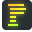

In [22]:
%%pyinstrument
inserted = _ingest.scrape_and_insert_bill_versions(db, todos)
inserted